# Real Time Anomaly Detection in CCTV Surveillance:

## Dataset Preparation:

In [1]:
import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os
import datetime

In [2]:
!pip install imageio

In [3]:
!pip install -q git+https://github.com/tensorflow/docs

In [4]:
from tensorflow import keras
from keras.utils.vis_utils import plot_model
import imageio
from tensorflow_docs.vis import embed

In [5]:
DATASET_FOLDER = "../input/real-time-anomaly-detection-in-cctv-surveillance/data"

In [6]:
dataset = os.listdir(DATASET_FOLDER)
label_types = os.listdir(DATASET_FOLDER)
print("Class Labels for Videos : ")
label_types.remove('test.csv')
label_types.remove('train.csv')
print(label_types)

Class Labels for Videos : 
['roadaccidents', 'assault', 'vandalism', 'arrest', 'shooting', 'arson', 'explosion', 'normal', 'shoplifting', 'robbery', 'stealing', 'burglary', 'abuse', 'fighting']


### Dataset Analysis

In [7]:
video_counts = []
total = 0
for i in range(len(label_types)):
    videos = len(os.listdir(os.path.join(DATASET_FOLDER, label_types[i])))
    video_counts.append(videos)
    total += videos

print(f"Total videos : {total}")
print(label_types)
print(video_counts)

Total videos : 1900
['roadaccidents', 'assault', 'vandalism', 'arrest', 'shooting', 'arson', 'explosion', 'normal', 'shoplifting', 'robbery', 'stealing', 'burglary', 'abuse', 'fighting']
[150, 50, 50, 50, 50, 50, 50, 950, 50, 150, 100, 100, 50, 50]


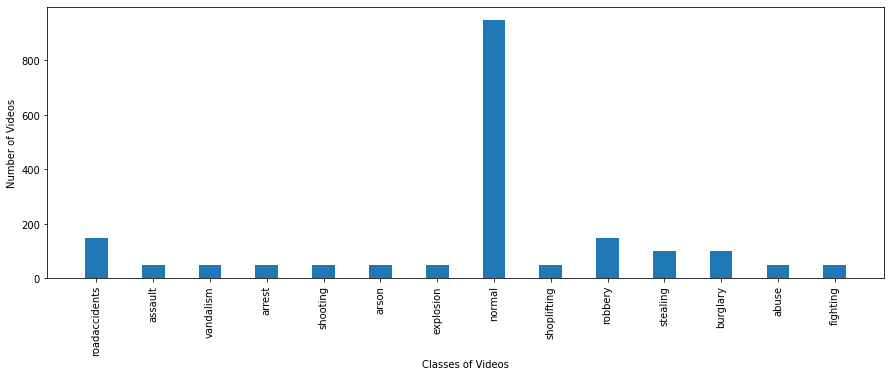

In [8]:
plt.figure(figsize=(15,5))
plt.bar(label_types, video_counts, width=0.4, align="center" )
plt.xticks(rotation=90)

plt.xlabel("Classes of Videos")
plt.ylabel("Number of Videos")
plt.show()

Text(0.5, 1.0, 'Share of Different Types Of Training Videos')

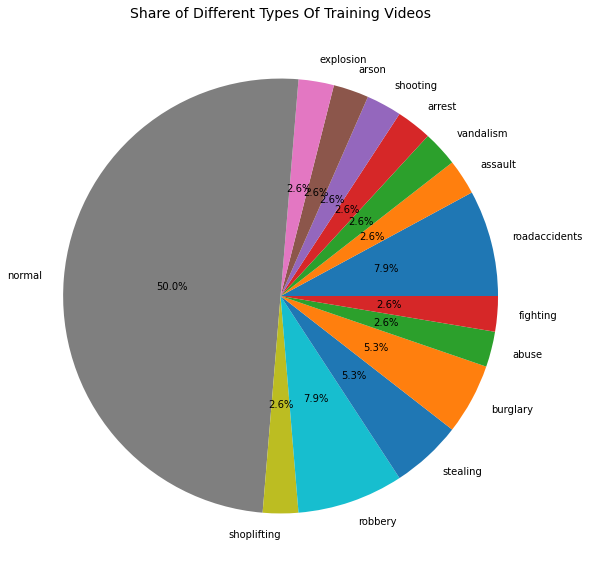

In [9]:
plt.figure(figsize=(15,10))
plt.pie(x=np.array(video_counts), autopct="%.1f%%", labels=label_types, pctdistance=0.5)
plt.title("Share of Different Types Of Training Videos", fontsize=14)

### Train and Test Split:

In [10]:
LABEL_COL = "label"
VIDEO_INFO_COL = "video_name"

In [11]:
data = []

for i in range(len(label_types)):
    for video in os.listdir(os.path.join(DATASET_FOLDER, label_types[i])): 
        data.append( (label_types[i] , f"../input/real-time-anomaly-detection-in-cctv-surveillance/data/{label_types[i]}/{video}") )

df = pd.DataFrame(data=data, columns=[ LABEL_COL, VIDEO_INFO_COL])

print(df)

              label                                         video_name
0     roadaccidents  ../input/real-time-anomaly-detection-in-cctv-s...
1     roadaccidents  ../input/real-time-anomaly-detection-in-cctv-s...
2     roadaccidents  ../input/real-time-anomaly-detection-in-cctv-s...
3     roadaccidents  ../input/real-time-anomaly-detection-in-cctv-s...
4     roadaccidents  ../input/real-time-anomaly-detection-in-cctv-s...
...             ...                                                ...
1895       fighting  ../input/real-time-anomaly-detection-in-cctv-s...
1896       fighting  ../input/real-time-anomaly-detection-in-cctv-s...
1897       fighting  ../input/real-time-anomaly-detection-in-cctv-s...
1898       fighting  ../input/real-time-anomaly-detection-in-cctv-s...
1899       fighting  ../input/real-time-anomaly-detection-in-cctv-s...

[1900 rows x 2 columns]


In [12]:
x = df[VIDEO_INFO_COL]
y = df[LABEL_COL]

In [13]:
from sklearn.model_selection import train_test_split

In [14]:
train, test = train_test_split(df, test_size = 0.2, stratify=y)

In [15]:
train.value_counts(LABEL_COL)

label
normal           760
roadaccidents    120
robbery          120
burglary          80
stealing          80
abuse             40
arrest            40
arson             40
assault           40
explosion         40
fighting          40
shooting          40
shoplifting       40
vandalism         40
dtype: int64

In [16]:
test.value_counts(LABEL_COL)

label
normal           190
roadaccidents     30
robbery           30
burglary          20
stealing          20
abuse             10
arrest            10
arson             10
assault           10
explosion         10
fighting          10
shooting          10
shoplifting       10
vandalism         10
dtype: int64

Text(0.5, 1.0, 'Share of Training and Testing Videos')

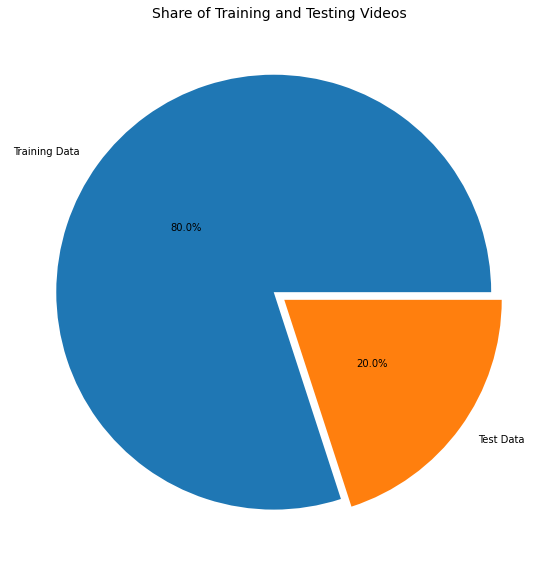

In [17]:
plt.figure(figsize=(15, 10))
plt.pie(x=np.array([len(train), len(test)]), autopct="%.1f%%", explode=[0.03, 0.03], labels=["Training Data", "Test Data"], pctdistance=0.5)
plt.title("Share of Training and Testing Videos", fontsize=14)

In [18]:
train.to_csv("../working/train.csv")
test.to_csv("../working/test.csv")

## Data Collection :

In [19]:
train_df = pd.read_csv("../working/train.csv")
test_df = pd.read_csv("../working/test.csv")

In [20]:
print(f"Total videos for training : {len(train_df)}")
print(f"Total videos for testing  : {len(test_df)}")

print("Training Dataframe : ")
print(train_df.head(10))

print("Testing Dataset    : ")
print(test_df.head(10))

Total videos for training : 1520
Total videos for testing  : 380
Training Dataframe : 
   Unnamed: 0          label  \
0        1723       burglary   
1         852         normal   
2          16  roadaccidents   
3        1616       stealing   
4        1700       burglary   
5        1638       stealing   
6        1406    shoplifting   
7         254         arrest   
8         355          arson   
9        1404    shoplifting   

                                          video_name  
0  ../input/real-time-anomaly-detection-in-cctv-s...  
1  ../input/real-time-anomaly-detection-in-cctv-s...  
2  ../input/real-time-anomaly-detection-in-cctv-s...  
3  ../input/real-time-anomaly-detection-in-cctv-s...  
4  ../input/real-time-anomaly-detection-in-cctv-s...  
5  ../input/real-time-anomaly-detection-in-cctv-s...  
6  ../input/real-time-anomaly-detection-in-cctv-s...  
7  ../input/real-time-anomaly-detection-in-cctv-s...  
8  ../input/real-time-anomaly-detection-in-cctv-s...  
9  ../inpu

## Feed the videos to a Network : 

In [21]:
IMG_SIZE = 299

def crop_center_square(frame):
    y, x = frame.shape[0:2]
    min_dim = min(y,x)
    # print(f"y : {y}      and      x : {x}")
    start_x = (x // 2) -  (min_dim // 2) 
    start_y = (y // 2) -  (min_dim // 2)
    return frame[ start_y : start_y+min_dim, start_x : start_x + min_dim]

In [22]:
def load_video(path, max_frames = 211, resize = (IMG_SIZE, IMG_SIZE)):

    cap = cv2.VideoCapture(path)
    framestot = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    fps = cap.get(cv2.CAP_PROP_FPS)    
    seconds = round(framestot / fps)
    video_time = datetime.timedelta(seconds=seconds)
    start = framestot - max_frames
    increment = framestot // max_frames
    
    print(f"Total frames {framestot}")
    print(f"Frames per sec {fps}")
    print(f"video time: {video_time}")
    
    frames = []
    
    try:
        while True:
            
            frame_to_fetch = len(frames)*increment
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_to_fetch)
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2,1,0]]
            frames.append(frame)
            if(len(frames) == max_frames):
                break
    finally:
        cap.release()
    return np.array(frames)

## Transfer Learning from Inception V3:

In [23]:
def build_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
        weights="imagenet",
        include_top=False,
        pooling="avg",
        input_shape=(IMG_SIZE, IMG_SIZE, 3),
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input

    inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    preprocessed = preprocess_input(inputs)

    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

In [24]:
feature_extractor = build_feature_extractor()

2023-01-02 18:34:51.149178: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-02 18:34:51.289458: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-02 18:34:51.290328: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-02 18:34:51.292081: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

87924736/87910968 [==============================] - 3s 0us/step


In [25]:
print(feature_extractor.summary())

Model: "feature_extractor"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 299, 299, 3)]     0         
_________________________________________________________________
tf.math.truediv (TFOpLambda) (None, 299, 299, 3)       0         
_________________________________________________________________
tf.math.subtract (TFOpLambda (None, 299, 299, 3)       0         
_________________________________________________________________
inception_v3 (Functional)    (None, 2048)              21802784  
Total params: 21,802,784
Trainable params: 21,768,352
Non-trainable params: 34,432
_________________________________________________________________
None


## Label Encoding
StringLookup layer encode the class labels as integers.

In [26]:
label_processor = keras.layers.StringLookup(num_oov_indices=0, vocabulary=np.unique(train_df["label"]))
print(label_processor.get_vocabulary())

labels = train_df["label"].values
labels = label_processor(labels[..., None]).numpy()
labels

['abuse', 'arrest', 'arson', 'assault', 'burglary', 'explosion', 'fighting', 'normal', 'roadaccidents', 'robbery', 'shooting', 'shoplifting', 'stealing', 'vandalism']


array([[4],
       [7],
       [8],
       ...,
       [4],
       [4],
       [5]])

## CNN Processing:

In [27]:
#Define hyperparameters

IMG_SIZE = 299
BATCH_SIZE = 64
EPOCHS = 100

MAX_SEQ_LENGTH = 210
NUM_FEATURES = 2048

In [28]:
def prepare_all_videos(df):
    num_samples = len(df)
    video_paths = df["video_name"].values.tolist()    
    
    ##take all classlabels from train_df column named 'label' and store in labels
    labels = df["label"].values

    #convert classlabels to label encoding
    labels = label_processor(labels[..., None]).numpy()

    # `frame_masks` and `frame_features` are what we will feed to our sequence model.
    # `frame_masks` will contain a bunch of booleans denoting if a timestep is
    # masked with padding or not.
    frame_masks = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH), dtype="bool") 
    frame_features = np.zeros(shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32") 

    # For each video.
    for idx, path in enumerate(video_paths):
        # Gather all its frames and add a batch dimension.
        print(f"\nProcessing video {idx+1} out of {num_samples}")
        
        frames = load_video(path)
        frames = frames[None, ...]
        # Initialize placeholders to store the masks and features of the current video.
        temp_frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
        temp_frame_features = np.zeros(
            shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
        )

        # Extract features from the frames of the current video.
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            print(f"Video Length received : {video_length}")
            length = min(MAX_SEQ_LENGTH, video_length)
            for j in range(length):
                print(j+1, end=' ')
                temp_frame_features[i, j, :] = feature_extractor.predict(
                    batch[None, j, :]
                )
            temp_frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

        frame_features[idx,] = temp_frame_features.squeeze()
        frame_masks[idx,] = temp_frame_mask.squeeze()

    return (frame_features, frame_masks), labels

In [29]:
train_data, train_labels = prepare_all_videos(train_df)


Processing video 1 out of 1520
Total frames 1125.0
Frames per sec 30.0
video time: 0:00:38
Video Length received : 211
1 

2023-01-02 18:35:05.492086: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2023-01-02 18:35:07.575453: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 
Processing video 2 out of 1520
Total frames 5129.0
Frames per sec 30.0
video time: 0:02:51
Video Length received : 211
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 

In [30]:
train_data

(array([[[2.2431979e-01, 5.4582167e-01, 3.0377299e-01, ...,
          1.0158183e-02, 1.6722250e-01, 1.2987723e+00],
         [2.1271698e-01, 5.6145382e-01, 3.2922471e-01, ...,
          7.9182955e-03, 1.7745423e-01, 1.2849430e+00],
         [3.0256093e-01, 5.7655084e-01, 3.0762005e-01, ...,
          2.6630653e-02, 3.4757066e-01, 1.4232433e+00],
         ...,
         [6.3670915e-01, 7.9935861e-01, 5.9269887e-01, ...,
          2.8368312e-01, 9.1165221e-01, 1.6479750e+00],
         [6.3521683e-01, 7.9958487e-01, 5.9332991e-01, ...,
          2.8326797e-01, 9.0952444e-01, 1.6476188e+00],
         [6.5317559e-01, 8.0315876e-01, 6.0860580e-01, ...,
          2.8846636e-01, 9.2867649e-01, 1.6683841e+00]],
 
        [[2.1905784e-01, 1.8452149e-02, 2.8350997e-01, ...,
          9.7199246e-02, 1.1917622e+00, 4.0488076e-01],
         [1.7672342e-01, 3.9365762e-03, 3.8264656e-01, ...,
          4.0439632e-02, 1.3974426e+00, 4.9752218e-01],
         [1.7149931e-01, 1.6730128e-02, 4.3235615e-01, 

In [31]:
test_data, test_labels = prepare_all_videos(test_df)


Processing video 1 out of 380
Total frames 920.0
Frames per sec 30.0
video time: 0:00:31
Video Length received : 211
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 
Processing video 2 out of 380
Total frames 1231.0
Frames per sec 30.0
video time: 0:00:41
Video Length received : 211
1 2 3 4 5 6 7 8 9 10 11 12 13 1

In [32]:
test_data

(array([[[0.11909042, 0.1682136 , 0.04846424, ..., 0.26894125,
          0.30576593, 1.0256324 ],
         [0.0572742 , 0.19095834, 0.05411154, ..., 0.2757911 ,
          0.29494098, 0.99163115],
         [0.11024953, 0.14928347, 0.05027431, ..., 0.26621625,
          0.28956023, 0.85212314],
         ...,
         [0.15920934, 0.26242352, 1.0400133 , ..., 0.06389709,
          0.47168756, 0.50136316],
         [0.14751485, 0.2577876 , 1.064636  , ..., 0.06434701,
          0.46287054, 0.49123293],
         [0.14872937, 0.2476688 , 1.0688064 , ..., 0.068352  ,
          0.46739575, 0.49988884]],
 
        [[0.21948043, 0.39752835, 0.36947066, ..., 0.23694554,
          0.23024628, 0.46329105],
         [0.13289312, 0.34611875, 0.3860003 , ..., 0.30392486,
          0.23804311, 0.28045076],
         [0.11717482, 0.3542006 , 0.24055576, ..., 0.01760464,
          0.55412054, 0.45501715],
         ...,
         [0.1134239 , 0.22318469, 0.22087777, ..., 0.09480037,
          0.14884192, 0.

## The sequence model
Now, we can feed this data to a sequence model consisting of recurrent layers like GRU.

In [33]:
# Utility for our sequence model.
def get_sequence_model():
    class_vocab = label_processor.get_vocabulary()

    frame_features_input = keras.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
    mask_input = keras.Input((MAX_SEQ_LENGTH,), dtype="bool")

    # Refer to the following tutorial to understand the significance of using `mask`:
    # https://keras.io/api/layers/recurrent_layers/gru/
    x = keras.layers.GRU(16, return_sequences=True)(frame_features_input, mask=mask_input)
    x = keras.layers.GRU(8)(x)
    x = keras.layers.Dropout(0.4)(x)
    x = keras.layers.Dense(8, activation="relu")(x)
    output = keras.layers.Dense(len(class_vocab), activation="softmax")(x)

    rnn_model = keras.Model([frame_features_input, mask_input], output)

    rnn_model.compile(
        loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"]
    )
    return rnn_model


In [34]:
EPOCHS = 100
# Utility for running experiments.
def run_experiment():
    filepath = "./tmp/video_classifier"
    checkpoint = keras.callbacks.ModelCheckpoint(
        filepath, save_weights_only=True, save_best_only=True, verbose=1
    )

    seq_model = get_sequence_model()
    history = seq_model.fit(
        [train_data[0], train_data[1]],
        train_labels,
        validation_split=0.3,
        epochs=EPOCHS,
        callbacks=[checkpoint],
    )

    seq_model.load_weights(filepath)
    _, accuracy = seq_model.evaluate([test_data[0], test_data[1]], test_labels)
    print(f"Test accuracy: {round(accuracy * 100, 2)}%")

    return history, seq_model

In [35]:
_, sequence_model = run_experiment()

2023-01-03 05:49:22.628585: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1830420480 exceeds 10% of free system memory.
2023-01-03 05:49:25.390200: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1830420480 exceeds 10% of free system memory.


Epoch 1/100
34/34 [==============================] - 14s 206ms/step - loss: 2.3117 - accuracy: 0.3759 - val_loss: 2.1800 - val_accuracy: 0.4693

Epoch 00001: val_loss improved from inf to 2.18000, saving model to ./tmp/video_classifier
Epoch 2/100
34/34 [==============================] - 3s 80ms/step - loss: 2.1385 - accuracy: 0.4962 - val_loss: 2.0792 - val_accuracy: 0.4693

Epoch 00002: val_loss improved from 2.18000 to 2.07916, saving model to ./tmp/video_classifier
Epoch 3/100
34/34 [==============================] - 3s 89ms/step - loss: 2.0265 - accuracy: 0.5103 - val_loss: 2.0271 - val_accuracy: 0.4693

Epoch 00003: val_loss improved from 2.07916 to 2.02706, saving model to ./tmp/video_classifier
Epoch 4/100
34/34 [==============================] - 3s 89ms/step - loss: 1.9368 - accuracy: 0.5160 - val_loss: 1.9484 - val_accuracy: 0.4693

Epoch 00004: val_loss improved from 2.02706 to 1.94836, saving model to ./tmp/video_classifier
Epoch 5/100
34/34 [==============================]

In [36]:
_.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

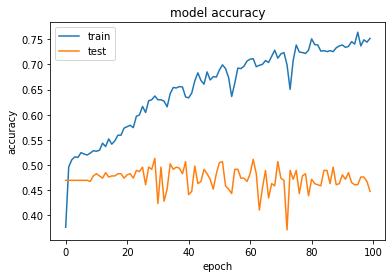

In [37]:
plt.plot(_.history['accuracy'])
plt.plot(_.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

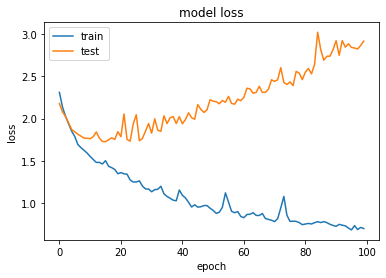

In [38]:
# summarize history for loss
plt.plot(_.history['loss'])
plt.plot(_.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

## Prediction

In [39]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, MAX_SEQ_LENGTH,), dtype="bool")
    frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(MAX_SEQ_LENGTH, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask

In [40]:
def sequence_prediction(path):
    class_vocab = label_processor.get_vocabulary()

    frames = load_video(os.path.join(path))
    frame_features, frame_mask = prepare_single_video(frames)
    probabilities = sequence_model.predict([frame_features, frame_mask])[0]

    for i in np.argsort(probabilities)[::-1]:
        print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
    return frames

In [41]:
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

Test video path: ../input/real-time-anomaly-detection-in-cctv-surveillance/data/normal/Normal_Videos_936_x264.mp4
Total frames 1150.0
Frames per sec 30.0
video time: 0:00:38
  normal: 93.44%
  robbery:  2.52%
  burglary:  0.92%
  shoplifting:  0.72%
  roadaccidents:  0.65%
  stealing:  0.57%
  arrest:  0.50%
  assault:  0.16%
  shooting:  0.12%
  fighting:  0.11%
  vandalism:  0.10%
  abuse:  0.07%
  explosion:  0.06%
  arson:  0.06%



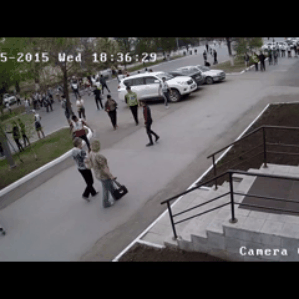

In [42]:
test_video = np.random.choice(test_df["video_name"].values.tolist())
print(f"Test video path: {test_video}")
test_frames = sequence_prediction(test_video)
to_gif(test_frames[:MAX_SEQ_LENGTH])